# Assignment 2: 

## Loading the Dataset and conducting EDA

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import imblearn


In [ ]:
df = pd.read_csv("/kaggle/input/mental/mental_health_data.csv") #load the datsaset

In [ ]:
print("Original Data shape: ", df.shape)
df.head()


Original Data shape:  (53043, 3)


,Unnamed: 0,statement,status
0,0,oh my gosh,Anxiety
1,1,"trouble sleeping, confused mind, restless hear...",Anxiety
2,2,"All wrong, back off dear, forward doubt. Stay ...",Anxiety
3,3,I've shifted my focus to something else but I'...,Anxiety
4,4,"I'm restless and restless, it's been a month n...",Anxiety


In [ ]:
#last 5 rows
df.tail()


,Unnamed: 0,statement,status
53038,53038,Nobody takes me seriously I’ve (24M) dealt wit...,Anxiety
53039,53039,"selfishness ""I don't feel very good, it's lik...",Anxiety
53040,53040,Is there any way to sleep better? I can't slee...,Anxiety
53041,53041,"Public speaking tips? Hi, all. I have to give ...",Anxiety
53042,53042,I have really bad door anxiety! It's not about...,Anxiety


In [ ]:
#description and distribution of the dataset
df.info()
df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53043 entries, 0 to 53042
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  53043 non-null  int64 
 1   statement   52681 non-null  object
 2   status      53043 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.2+ MB


,Unnamed: 0
count,53043.000000
mean,26521.000000
std,15312.339501
min,0.000000
25%,13260.500000
50%,26521.000000
75%,39781.500000
max,53042.000000


In [ ]:
df = df.drop('Unnamed: 0', axis=1)#drop the unncessary numbered column 

In [ ]:
df.describe(include='all') #there are not too many duplicates. Most statments are unique

,statement,status
count,52681,53043
unique,51073,7
top,what do you mean?,Normal
freq,22,16351


In [33]:
df[df["statement"].isnull()]
df = df.dropna(subset=['statement', 'status'])#drop rows with missing values in statement and status


In [34]:
print("Data shape after dropping missing values: ", df.shape)

Data shape after dropping missing values:  (52681, 2)


In [37]:
# Print 5 examples of each class 
for label in df['status'].unique():
    print(f"\n Examples for class: {label} ")
    examples = df[df['status'] == label]['statement'].sample(5, random_state=42)
    for i, stmt in enumerate(examples, 1):
        print(f"{i}. {stmt}")


 Examples for class: Anxiety 
1. Is this health anxiety? 1) checking temperature 10 times a day
2) checking blood pressure everyday
3) checking weight 10 times a day

Thinking I might have a serious disease
2. Is there any way to sleep better? I can't sleep most of the nights, meds didn't help.
3. Lamictal ? Anyone with good reviews about lamictal?
4. Has anyone tried EMDR therapy? I just started. If so, what are your thoughts? I like it so far but mostly just because it triggers my ASMR. 

Did you have success?
5. would my may2018 ECG of picked this up? worried! so; yesterday I was drilling some wood and I out of nowhere felt a dul pain in my left arm and  chest, I think it was brought on by putting arm in or moving it in specific positions, and when I  took a breath, my left side of chest hurt! it went on like for a few seconds and the simptoms subsided  but sometimes if I take a deep breath or lay in some positions it hurts the arm or chest but if I  am just sitting still on my com

In [ ]:
#calculate length of each statement
df.loc[:, 'text_length'] = df['statement'].apply(lambda x: len(x.split())) 

In [ ]:
print("Text length statistics:")
df['text_length'].describe() 
#There are some extreme outliers 

Text length statistics:


count    52681.000000
mean       113.158729
std        163.735305
min          1.000000
25%         15.000000
50%         62.000000
75%        148.000000
max       6300.000000
Name: text_length, dtype: float64

import pandas as pd
import numpy as np



### Class Distribution

In [ ]:
#calculate count and percentages of each class
class_count = df['status'].value_counts()
class_pct = df['status'].value_counts(normalize=True) * 100

class_summary = pd.DataFrame({
    'Count': class_count,
    'Percentage': class_pct.round(2)
})

print(class_summary)



                      Count  Percentage
status                                 
Normal                16343       31.02
Depression            15404       29.24
Suicidal              10652       20.22
Anxiety                3841        7.29
Bipolar                2777        5.27
Stress                 2587        4.91
Personality disorder   1077        2.04


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


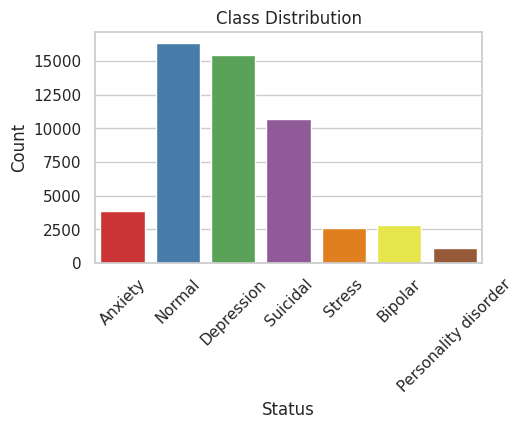

In [ ]:
#plot class distribution
plt.figure(figsize=(5, 3))
sns.countplot(data=df, x='status', palette='Set1')
plt.title('Class Distribution')
plt.xlabel('Status')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()



### Text Length Analysis

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


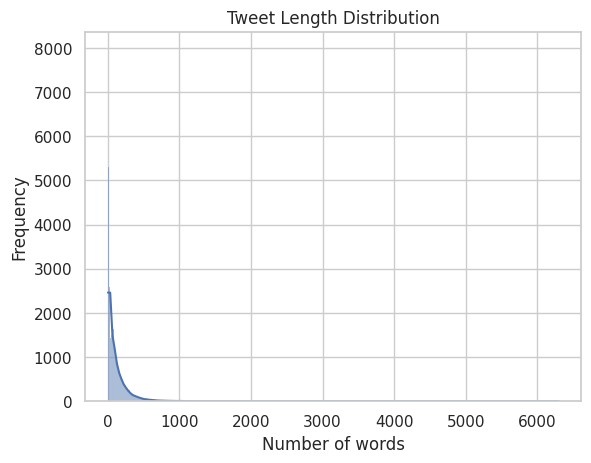

In [ ]:
sns.histplot(df['text_length'], bins='auto', kde=True)
plt.title('Tweet Length Distribution')
plt.xlabel('Number of words') 
plt.ylabel('Frequency')
plt.show()
###This is extremely skewed. 

In [108]:
#print how many tweets have with more than 1000 words
long_tweets = df[df['text_length'] > 1000]
print(f"Number of tweets with more than 1000 words: {len(long_tweets)}")
#print which class they belong to 
print("Classes of long tweets:")
print(long_tweets['status'].value_counts())


Number of tweets with more than 1000 words: 209
Classes of long tweets:
status
Depression              121
Suicidal                 61
Anxiety                  11
Bipolar                   8
Personality disorder      6
Stress                    2
Name: count, dtype: int64


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


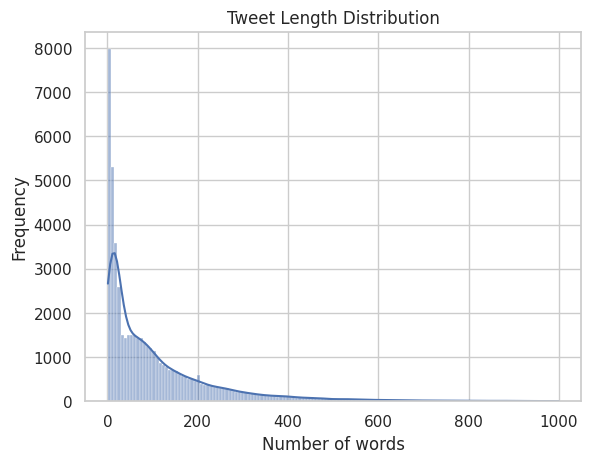

In [ ]:
#plotting the distribution again
sns.histplot(df['text_length'], bins='auto', kde=True)
plt.title('Tweet Length Distribution')
plt.xlabel('Number of words') 
plt.ylabel('Frequency')
plt.show()


In [138]:
print("Text length statistics:")
df['text_length'].describe() 
#There are some extreme outliers 

Text length statistics:


count    52472.000000
mean       107.998380
std        135.326859
min          1.000000
25%         15.000000
50%         62.000000
75%        147.000000
max       1000.000000
Name: text_length, dtype: float64

### Vocabulary Analysis

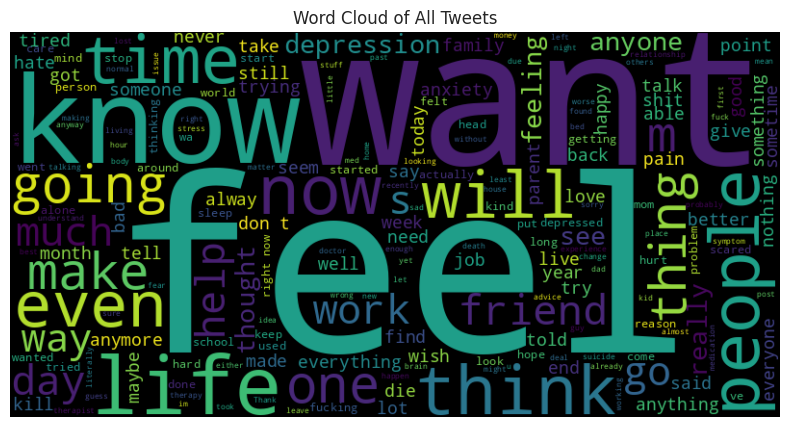

In [ ]:
from wordcloud import WordCloud
text = " ".join(df['statement'])
wordcloud = WordCloud(width=800, height=400).generate(text)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title("Word Cloud of All Tweets")
plt.show()

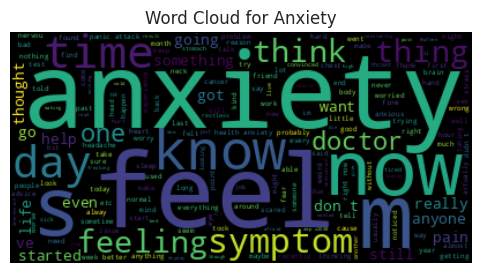

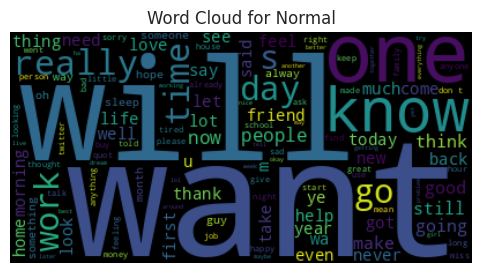

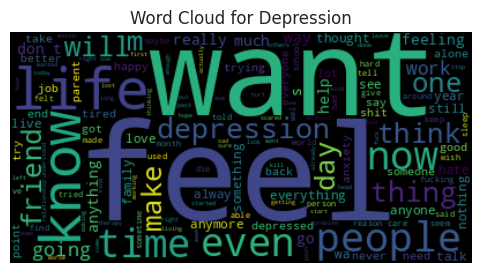

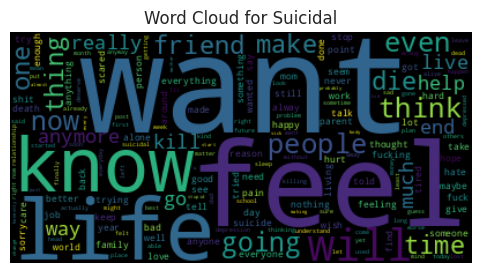

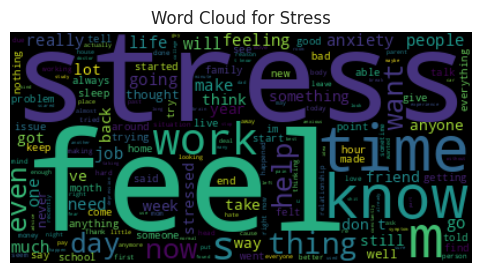

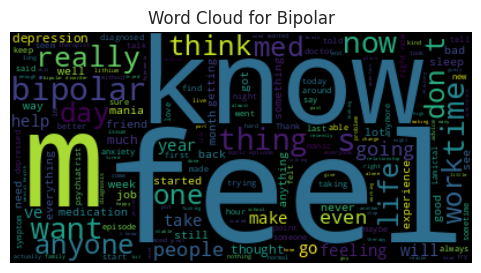

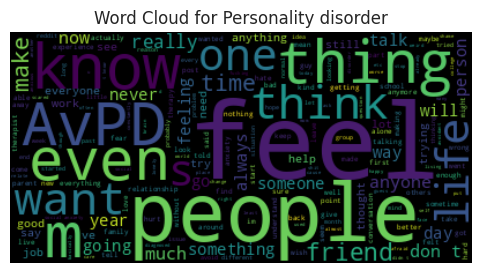

In [114]:
for label in df['status'].unique():
    text = " ".join(df[df['status'] == label]['statement'])
    wordcloud = WordCloud(width=400, height=200).generate(text)
    plt.figure(figsize=(6, 3))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Word Cloud for {label}")
    plt.show()


<ipython-input-119-138b9ef1c5a5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['text_len'] = df['statement'].apply(lambda x: len(x.split()))


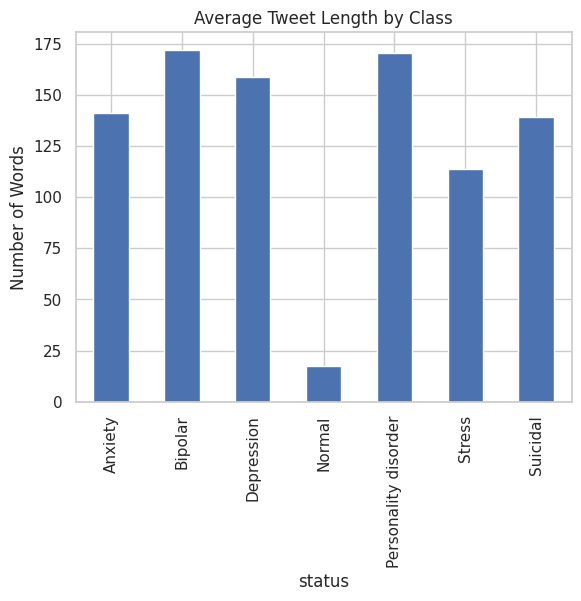

In [119]:
df['text_len'] = df['statement'].apply(lambda x: len(x.split()))
df.groupby('status')['text_len'].mean().plot(kind='bar')
plt.title("Average Tweet Length by Class")
plt.ylabel("Number of Words")
plt.show()



### Vocabulary and Word Analysis

In [137]:
from collections import Counter
import numpy as np

all_words = " ".join(df['cleaned_statement']).split()
word_counts = Counter(all_words)
print(len(word_counts))  # total unique words


72318


In [ ]:

def analyze_vocabulary(texts):
    # Tokenize all words
    all_words = [word.lower() for text in texts for word in text.split()]
    
    # Count word frequencies
    word_freq = Counter(all_words)
    
    # Sort words by frequency
    sorted_words = sorted(word_freq.items(), key=lambda x: x[1], reverse=True)
    
    # Calculate cumulative coverage
    total_words = len(all_words)
    cumulative_coverage = []
    cumulative_count = 0
    
    for i, (word, count) in enumerate(sorted_words, 1):
        cumulative_count += count
        coverage = cumulative_count / total_words * 100
        cumulative_coverage.append((i, coverage))
    
    # Plotting
    plt.figure(figsize=(12,5))
    
    # Word Frequency Distribution
    plt.subplot(1,2,1)
    plt.plot([x[0] for x in cumulative_coverage], [x[1] for x in cumulative_coverage])
    plt.title('Cumulative Vocabulary Coverage')
    plt.xlabel('Number of Unique Words')
    plt.ylabel('Cumulative Coverage (%)')
    plt.xscale('log')
    
    # Top 50 Word Frequencies
    plt.subplot(1,2,2)
    top_50_words = sorted_words[:50]
    plt.bar([word for word, _ in top_50_words], [count for _, count in top_50_words])
    plt.title('Top 50 Word Frequencies')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()
    
    # Print key statistics
    print("Vocabulary Analysis:")
    print(f"Total unique words: {len(word_freq)}")
    print(f"Total word count: {total_words}")
    
    # Find coverage points
    coverage_points = [
        (1000, next(x[1] for x in cumulative_coverage if x[0] == 1000)),
        (5000, next(x[1] for x in cumulative_coverage if x[0] == 5000)),
        (10000, next(x[1] for x in cumulative_coverage if x[0] == 10000)),
    ]
    
    print("\nCoverage at different vocabulary sizes:")
    for words, coverage in coverage_points:
        print(f"{words} words cover {coverage:.2f}% of the corpus")
    
    return {
        'word_freq': word_freq,
        'sorted_words': sorted_words,
        'cumulative_coverage': cumulative_coverage
    }



In [5]:
import pandas as pd
from collections import Counter
import nltk
from nltk.corpus import stopwords
import re

nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [5]:


def clean_text(text):
    text = re.sub(r'[^\w\s]', '', str(text).lower())
    return text

df['cleaned_statement'] = df['statement'].apply(clean_text)
df = df[df['cleaned_statement'].notnull()]

stop_words = set(stopwords.words('english'))

In [6]:
def tokenize(text):
    return [word for word in text.split() if word not in stop_words]

df['tokens'] = df['cleaned_statement'].apply(tokenize)

class_keywords = {}
for label in df['status'].unique():
    words = [word for tokens in df[df['status'] == label]['tokens'] for word in tokens]
    word_freq = Counter(words)
    class_keywords[label] = word_freq.most_common(5)

In [7]:
print("Top 5 keywords for each class:")
for label, keywords in class_keywords.items():
    print(f"\n{label}:")
    for word, freq in keywords:
        print(f"{word}: {freq}")

Top 5 keywords for each class:

Anxiety:
im: 6033
anxiety: 3666
like: 3192
ive: 2676
feel: 2241

Normal:
im: 1459
like: 1231
want: 1121
dont: 1002
get: 874

Depression:
like: 17410
feel: 15938
want: 11612
life: 10505
know: 10242

Suicidal:
want: 10370
like: 8650
life: 7362
feel: 7235
cannot: 6384

Stress:
im: 2812
like: 1696
stress: 1478
feel: 1331
dont: 1281

Bipolar:
im: 5705
like: 2982
feel: 2379
ive: 2221
dont: 2198

Personality disorder:
im: 2000
like: 1616
people: 1216
dont: 1179
feel: 1080


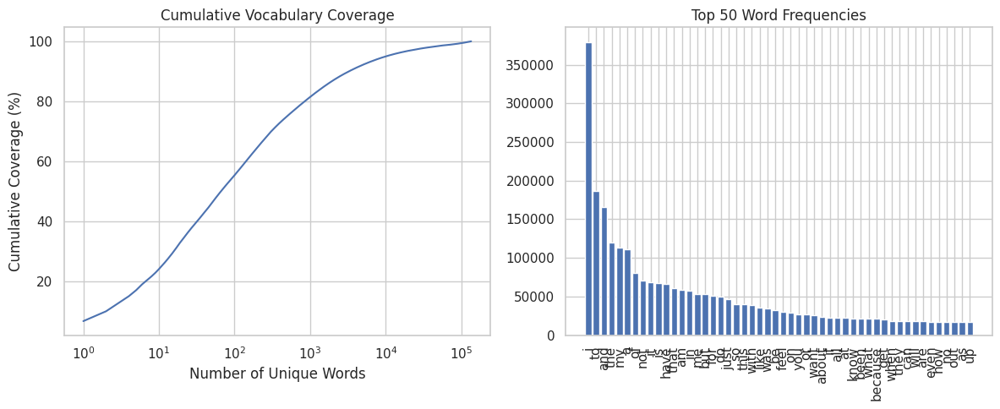

Vocabulary Analysis:
Total unique words: 134519
Total word count: 5666891

Coverage at different vocabulary sizes:
1000 words cover 81.45% of the corpus
5000 words cover 92.19% of the corpus
10000 words cover 94.97% of the corpus


{'word_freq': Counter({'oh': 684,
          'my': 113466,
          'gosh': 29,
          'trouble': 485,
          'sleeping,': 57,
          'confused': 397,
          'mind,': 189,
          'restless': 257,
          'heart.': 173,
          'all': 22399,
          'out': 17298,
          'of': 79979,
          'tune': 15,
          'wrong,': 259,
          'back': 7591,
          'off': 5120,
          'dear,': 3,
          'forward': 813,
          'doubt.': 20,
          'stay': 1884,
          'in': 57530,
          'a': 111668,
          'and': 165696,
          'place': 1956,
          "i've": 4255,
          'shifted': 18,
          'focus': 698,
          'to': 186123,
          'something': 7299,
          'else': 3948,
          'but': 53376,
          "i'm": 11021,
          'still': 8146,
          'worried': 1351,
          'restless,': 72,
          "it's": 4972,
          'been': 21103,
          'month': 2115,
          'now,': 1649,
          'boy.': 32,
          

In [141]:
analyze_vocabulary(df['statement'].tolist())

## Preprocessing 

In [109]:
#remove long tweets
df = df[df['text_length'] <= 1000]


In [ ]:
import unicodedata
import contractions

def standardize_accented_chars(text):
    return unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')

def remove_special_chars(text):
    return ''.join(e for e in text if e.isalnum() or e.isspace())



In [129]:
#preprocessing the text data
import re
def clean_text(text):
    text = text.lower()  # Convert to lowercase
    text = standardize_accented_chars(text)  # Standardize accented characters
    text = remove_special_chars(text)  # Remove special characters
    text = contractions.fix(text)  # Expand contractions
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)  # Remove URLs
    text = re.sub(r'@\w+', '', text)  # Remove mentions
    text = re.sub(r'#\w+', '', text)  # Remove hashtags
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = re.sub(r'\s+', ' ', text)  # Remove extra whitespace
    text = text.strip()  # Remove leading/trailing whitespace
    return text


In [131]:
df.loc[:, 'cleaned_statement'] = df['statement'].apply(clean_text)


In [133]:
#save the cleaned data
df.to_csv("cleaned_mental_health_data.csv", index=False)


In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model



In [ ]:
max_words = 5000
max_len = 150 


In [10]:
df = pd.read_csv("cleaned_mental_health_data.csv")

In [11]:
df = df[df['cleaned_statement'].notnull()]


In [ ]:
tokenizer = Tokenizer(num_words=max_words, oov_token='<OOV>')
tokenizer.fit_on_texts(df['cleaned_statement'])
X = tokenizer.texts_to_sequences(df['cleaned_statement'])
X = pad_sequences(X, maxlen=max_len, padding='post', truncating='post')


In [39]:
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['status'])  # Integer encoded
num_classes = len(np.unique(y))


In [23]:
import pickle
with open("tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)
with open("label_encoder.pkl", "wb") as f:
    pickle.dump(label_encoder, f)

In [ ]:
max_words = 5000
max_len = 150 


In [ ]:
df = pd.read_csv("cleaned_mental_health_data.csv")

In [ ]:
df = df[df['cleaned_statement'].notnull()]


## BiLSTM

In [193]:
tokenizer = Tokenizer(num_words=max_words, oov_token='<OOV>')
tokenizer.fit_on_texts(df['cleaned_statement'])
X = tokenizer.texts_to_sequences(df['cleaned_statement'])
X = pad_sequences(X, maxlen=max_len, padding='post', truncating='post')


In [194]:
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['status'])  # Integer encoded
num_classes = len(np.unique(y))


In [195]:
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=22)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=22)


In [197]:
np.save("X_test_bilstm.npy", X_test)
np.save("y_test_bilstm.npy", y_test)
np.save("X_train_bilstm.npy", X_train)
np.save("y_train_bilstm.npy", y_train)
np.save("X_val_bilstm.npy", X_val)
np.save("y_val_bilstm.npy", y_val)

In [ ]:
model = Sequential([
    Embedding(input_dim=max_words, output_dim=embedding_dim , input_length=max_len),
    Bidirectional(LSTM(lstm_units)),
    Dropout(0.5),
    Dense(64, activation="relu"),
    Dropout(0.3),
    Dense(num_classes, activation="softmax")
])


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


In [ ]:
model.compile(loss="sparse_categorical_crossentropy", optimizer=Adam(learning_rate=0.001), metrics=["accuracy"])

early_stopping = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=20,
    batch_size=32,
    callbacks=[early_stopping]
)
# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

#save the model
model.save("mental_health_model.h5")




Epoch 1/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 25s 18ms/step - accuracy: 0.8230 - loss: 0.4909 - val_accuracy: 0.7479 - val_loss: 0.7012
Epoch 2/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 23s 18ms/step - accuracy: 0.8422 - loss: 0.4320 - val_accuracy: 0.7530 - val_loss: 0.6927
Epoch 3/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 23s 18ms/step - accuracy: 0.8650 - loss: 0.3703 - val_accuracy: 0.7480 - val_loss: 0.7740
Epoch 4/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 23s 18ms/step - accuracy: 0.8835 - loss: 0.3285 - val_accuracy: 0.7414 - val_loss: 0.8213
Epoch 5/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 23s 18ms/step - accuracy: 0.8976 - loss: 0.2882 - val_accuracy: 0.7402 - val_loss: 0.8944
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7564 - loss: 0.6913
Test Loss: 0.6831
Test Accuracy: 0.7604


In [ ]:
bilstm_model = load_model("mental_health_model.h5")



In [ ]:
# Get predicted probabilities
y_pred_probs = bilstm_model.predict(X_test)

# Convert probabilities to class predictions
y_pred = y_pred_probs.argmax(axis=1)

164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy:  {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")


Accuracy:  0.7604
Precision: 0.7673
Recall:    0.7604
F1 Score:  0.7615


In [ ]:


print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


                      precision    recall  f1-score   support

             Anxiety       0.85      0.80      0.82       384
             Bipolar       0.79      0.81      0.80       273
          Depression       0.74      0.64      0.69      1485
              Normal       0.92      0.92      0.92      1681
Personality disorder       0.53      0.48      0.50       107
              Stress       0.50      0.54      0.52       250
            Suicidal       0.61      0.73      0.66      1067

            accuracy                           0.76      5247
           macro avg       0.71      0.70      0.70      5247
        weighted avg       0.77      0.76      0.76      5247



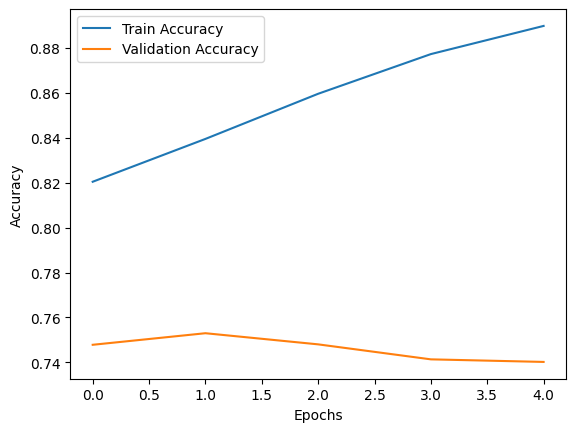

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy
plt.plot(history.history["accuracy"], label="Train Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


In [5]:
bilstm_model = load_model("mental_health_model.h5")



In [6]:
# Get predicted probabilities
y_pred_probs = bilstm_model.predict(X_test)

# Convert probabilities to class predictions
y_pred = y_pred_probs.argmax(axis=1)

164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step


## LSTM model


In [4]:
import numpy as np
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report
from tensorflow.keras.models import load_model




In [164]:
max_words = 5000
max_len = 150 
embedding_dim = 128
lstm_units = 64

In [168]:
df = pd.read_csv("cleaned_mental_health_data.csv")
df = df[df['cleaned_statement'].notnull()]

In [ ]:
tokenizer = Tokenizer(num_words=max_words, oov_token='<OOV>')
tokenizer.fit_on_texts(df['cleaned_statement'])
X = tokenizer.texts_to_sequences(df['cleaned_statement'])
X = pad_sequences(X, maxlen=max_len, padding='post', truncating='post')


with open("lstm_tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)


In [173]:

label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['status'])  # Integer encoded
num_classes = len(np.unique(y))

with open("lstm_label_encoder.pkl", "wb") as f:
    pickle.dump(label_encoder, f)

In [176]:

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=22)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=22)

In [177]:
np.save("X_test_lstm.npy", X_test)
np.save("y_test_lstm.npy", y_test)
np.save("X_train_lstm.npy", X_train)
np.save("y_train_lstm.npy", y_train)
np.save("X_val_lstm.npy", X_val)
np.save("y_val_lstm.npy", y_val)

In [ ]:

# Evaluation
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")
model.save("lstm_model.h5")


#load the model
lstm_model = load_model("lstm_model.h5")

y_pred_probs = lstm_model.predict(X_test)

# Convert probabilities to class predictions
y_pred = y_pred_probs.argmax(axis=1)


In [178]:
# Single LSTM Model
model = Sequential([
    Embedding(input_dim=max_words, output_dim=embedding_dim),
    LSTM(lstm_units),
    Dropout(0.5),
    Dense(64, activation="relu"),
    Dropout(0.3),
    Dense(num_classes, activation="softmax")
])

model.compile(loss="sparse_categorical_crossentropy", optimizer=Adam(learning_rate=0.001), metrics=["accuracy"])
early_stopping = EarlyStopping(monitor="val_loss", patience=3, restore_best_weights=True)


In [179]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=20,
    batch_size=32,
    callbacks=[early_stopping]
)

Epoch 1/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - accuracy: 0.4056 - loss: 1.5700 - val_accuracy: 0.5338 - val_loss: 1.2778
Epoch 2/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.5598 - loss: 1.1647 - val_accuracy: 0.5950 - val_loss: 1.0015
Epoch 3/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.6063 - loss: 0.9494 - val_accuracy: 0.6118 - val_loss: 0.9267
Epoch 4/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.6340 - loss: 0.8493 - val_accuracy: 0.6480 - val_loss: 0.8679
Epoch 5/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.6900 - loss: 0.7601 - val_accuracy: 0.7109 - val_loss: 0.7874
Epoch 6/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.7699 - loss: 0.6333 - val_accuracy: 0.7299 - val_loss: 0.7763
Epoch 7/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.7976 - loss: 0.5543 - val_accuracy: 0.7301 - val_loss: 0.7922
Epoch 8/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.8219 - loss: 0

In [180]:
model.save("lstm_model.h5")

In [ ]:
# evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")



164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7444 - loss: 0.7503
Test Loss: 0.7515
Test Accuracy: 0.7425


In [189]:
#load the model
lstm_model = load_model("lstm_model.h5")
X_test = np.load("X_test_lstm.npy")
y_pred_probs = lstm_model.predict(X_test)

# Convert probabilities to class predictions
y_pred = y_pred_probs.argmax(axis=1)


164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


In [190]:
y_test = np.load("y_test_lstm.npy")
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print(f"Accuracy:  {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")


Accuracy:  0.7425
Precision: 0.7403
Recall:    0.7425
F1 Score:  0.7389


In [191]:
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))

                      precision    recall  f1-score   support

             Anxiety       0.81      0.72      0.76       384
             Bipolar       0.67      0.77      0.71       273
          Depression       0.67      0.75      0.70      1485
              Normal       0.94      0.90      0.92      1681
Personality disorder       0.00      0.00      0.00       107
              Stress       0.40      0.60      0.48       250
            Suicidal       0.68      0.60      0.64      1067

            accuracy                           0.74      5247
           macro avg       0.59      0.62      0.60      5247
        weighted avg       0.74      0.74      0.74      5247



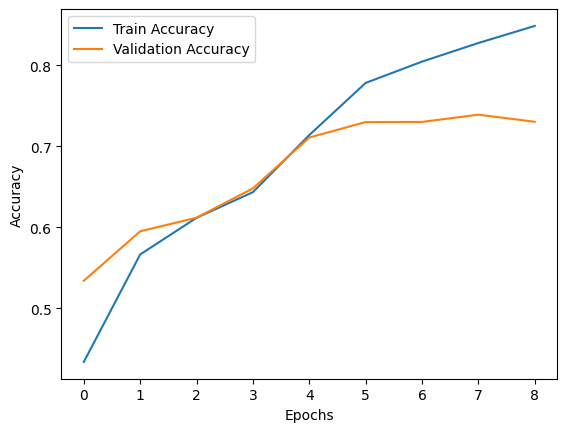

In [192]:

# Plot training & validation accuracy
plt.plot(history.history["accuracy"], label="Train Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

## LSTM without stopwords

In [24]:
stop_words = set(stopwords.words('english'))

def remove_stopwords(text):
    return ' '.join([word for word in text.split() if word not in stop_words])

df['cleaned_statement_no_stop'] = df['cleaned_statement'].fillna("").apply(remove_stopwords)

In [7]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Parameters
max_words = 5000
max_len = 150

# Tokenize
tokenizer = Tokenizer(num_words=max_words, oov_token="<OOV>")
tokenizer.fit_on_texts(df['cleaned_statement_no_stop'])

X = tokenizer.texts_to_sequences(df['cleaned_statement_no_stop'])
X = pad_sequences(X, maxlen=max_len, padding='post', truncating='post')

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['status'])
num_classes = len(np.unique(y))

# Train/val/test split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=22)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=22)


In [8]:
# Parameters
max_words = 5000
max_len = 150

# Tokenize
tokenizer = Tokenizer(num_words=max_words, oov_token="<OOV>")
tokenizer.fit_on_texts(df['cleaned_statement_no_stop'])

X = tokenizer.texts_to_sequences(df['cleaned_statement_no_stop'])
X = pad_sequences(X, maxlen=max_len, padding='post', truncating='post')

In [9]:
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['status'])
num_classes = len(np.unique(y))

# Train/val/test split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=22)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=22)


In [10]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

embedding_dim = 128
lstm_units = 64

model = Sequential([
    Embedding(input_dim=max_words, output_dim=embedding_dim, input_length=max_len),
    LSTM(lstm_units),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(num_classes, activation='softmax')
])

model.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=20,
    batch_size=32,
    callbacks=[early_stopping]
)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 16s 8ms/step - accuracy: 0.3158 - loss: 1.6300 - val_accuracy: 0.3398 - val_loss: 1.5653
Epoch 2/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.3832 - loss: 1.5229 - val_accuracy: 0.5693 - val_loss: 1.0259
Epoch 3/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.5773 - loss: 0.9816 - val_accuracy: 0.6139 - val_loss: 0.8482
Epoch 4/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.6347 - loss: 0.7988 - val_accuracy: 0.6996 - val_loss: 0.7558
Epoch 5/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.7210 - loss: 0.6855 - val_accuracy: 0.7343 - val_loss: 0.7046
Epoch 6/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.7813 - loss: 0.5777 - val_accuracy: 0.7498 - val_loss: 0.6610
Epoch 7/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.8099 - loss: 0.5086 - val_accuracy: 0.7469 - val_loss: 0.7077
Epoch 8/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.8376 - loss: 0

In [11]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Evaluate
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

# Predict
y_pred_probs = model.predict(X_test)
y_pred = y_pred_probs.argmax(axis=1)

# Metrics
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision_score(y_test, y_pred, average='weighted'):.4f}")
print(f"Recall:    {recall_score(y_test, y_pred, average='weighted'):.4f}")
print(f"F1 Score:  {f1_score(y_test, y_pred, average='weighted'):.4f}")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.7531 - loss: 0.6783
Test Loss: 0.6762
Test Accuracy: 0.7559
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Accuracy:  0.7559
Precision: 0.7658
Recall:    0.7559
F1 Score:  0.7553
                      precision    recall  f1-score   support

             Anxiety       0.84      0.73      0.78       400
             Bipolar       0.80      0.74      0.77       250
          Depression       0.76      0.68      0.72      1555
              Normal       0.89      0.93      0.91      1649
Personality disorder       0.41      0.10      0.16       111
              Stress       0.38      0.70      0.49       256
            Suicidal       0.66      0.69      0.68      1027

            accuracy                           0.76      5248
           macro avg       0.68      0.65      0.64      5248
        weighted avg       0.77      0.76      0.76      5248



In [12]:
#save the model
model.save("lstm_no_stop_model.h5")


In [14]:
#save the tokenizer and label encoder
import pickle
with open("lstm_no_stop_tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)
with open("lstm_no_stop_label_encoder.pkl", "wb") as f:
    pickle.dump(label_encoder, f)


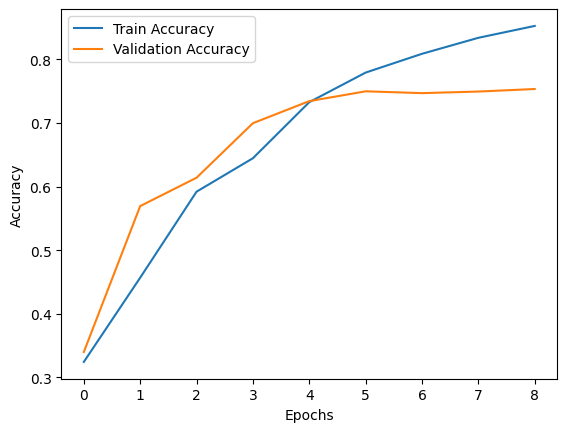

In [15]:
plt.plot(history.history["accuracy"], label="Train Accuracy")
plt.plot(history.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

## BILSTM without stop words

In [16]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Parameters
max_words = 5000
max_len = 150

# Tokenization
tokenizer = Tokenizer(num_words=max_words, oov_token='<OOV>')
tokenizer.fit_on_texts(df['cleaned_statement_no_stop'])
X = tokenizer.texts_to_sequences(df['cleaned_statement_no_stop'])
X = pad_sequences(X, maxlen=max_len, padding='post', truncating='post')

# Encode labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(df['status'])
num_classes = len(np.unique(y))

# Split data
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.2, random_state=22)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=22)

In [17]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam

embedding_dim = 128
lstm_units = 64

model = Sequential([
    Embedding(input_dim=max_words, output_dim=embedding_dim, input_length=max_len),
    Bidirectional(LSTM(lstm_units)),
    Dropout(0.5),
    Dense(64, activation='relu'),
    Dropout(0.3),
    Dense(num_classes, activation='softmax')
])

model.compile(loss='sparse_categorical_crossentropy', optimizer=Adam(learning_rate=0.001), metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=20,
    batch_size=32,
    callbacks=[early_stopping]
)


Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


1312/1312 ━━━━━━━━━━━━━━━━━━━━ 19s 13ms/step - accuracy: 0.5540 - loss: 1.1149 - val_accuracy: 0.7284 - val_loss: 0.6966
Epoch 2/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.7461 - loss: 0.6626 - val_accuracy: 0.7524 - val_loss: 0.6407
Epoch 3/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.7929 - loss: 0.5485 - val_accuracy: 0.7694 - val_loss: 0.6080
Epoch 4/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.8206 - loss: 0.4800 - val_accuracy: 0.7648 - val_loss: 0.6389
Epoch 5/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.8411 - loss: 0.4312 - val_accuracy: 0.7719 - val_loss: 0.6402
Epoch 6/20
1312/1312 ━━━━━━━━━━━━━━━━━━━━ 16s 12ms/step - accuracy: 0.8610 - loss: 0.3776 - val_accuracy: 0.7682 - val_loss: 0.6454


In [18]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Evaluate model
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

# Predict
y_pred_probs = model.predict(X_test)
y_pred = y_pred_probs.argmax(axis=1)

# Performance metrics
print(f"Accuracy:  {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision_score(y_test, y_pred, average='weighted'):.4f}")
print(f"Recall:    {recall_score(y_test, y_pred, average='weighted'):.4f}")
print(f"F1 Score:  {f1_score(y_test, y_pred, average='weighted'):.4f}")
print(classification_report(y_test, y_pred, target_names=label_encoder.classes_))


164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7782 - loss: 0.5988
Test Loss: 0.6047
Test Accuracy: 0.7759
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Accuracy:  0.7759
Precision: 0.7744
Recall:    0.7759
F1 Score:  0.7749
                      precision    recall  f1-score   support

             Anxiety       0.78      0.84      0.81       400
             Bipolar       0.84      0.79      0.81       250
          Depression       0.74      0.73      0.73      1555
              Normal       0.91      0.93      0.92      1649
Personality disorder       0.57      0.51      0.54       111
              Stress       0.54      0.55      0.55       256
            Suicidal       0.68      0.66      0.67      1027

            accuracy                           0.78      5248
           macro avg       0.72      0.72      0.72      5248
        weighted avg       0.77      0.78      0.77      5248



In [19]:
#save the model
model.save("bilstm_no_stop_model.h5")
#save the tokenizer and label encoder
with open("bilstm_no_stop_tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)
with open("bilstm_no_stop_label_encoder.pkl", "wb") as f:
    pickle.dump(label_encoder, f)


In [20]:
# save x train, y_train, x_test, y_test
np.save("X_test_bilstm_no_stop.npy", X_test)
np.save("y_test_bilstm_no_stop.npy", y_test)
np.save("X_train_bilstm_no_stop.npy", X_train)
np.save("y_train_bilstm_no_stop.npy", y_train)
np.save("X_val_bilstm_no_stop.npy", X_val)
np.save("y_val_bilstm_no_stop.npy", y_val)


## BERT

In [24]:
!pip install transformers datasets torch

In [114]:
from transformers import (
    AutoTokenizer,
    AutoModelForSequenceClassification,
    Trainer,
    TrainingArguments
)


In [115]:
#preprocess the statements
df = pd.read_csv("cleaned_mental_health_data.csv")
df = df[df['statement'].notnull()]
df = df[df['statement'].str.strip() != '']

In [116]:
label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['status'])

In [117]:
train_texts, temp_texts, train_labels, temp_labels = train_test_split(
    df['statement'].tolist(), df['label'].tolist(), test_size=0.2, random_state=22
)
val_texts, test_texts, val_labels, test_labels = train_test_split(
    temp_texts, temp_labels, test_size=0.5, random_state=22
)


In [127]:
import json
test_original_labels = [label_encoder.classes_[label] for label in test_labels]
with open("bert_test_data.json", "w") as f:
    json.dump({
        "texts": test_texts,
        "labels": test_labels,
        "original_labels": test_original_labels
    }, f)

In [128]:
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
train_encodings = tokenizer(train_texts, truncation=True, padding=True, max_length=128)
val_encodings = tokenizer(val_texts, truncation=True, padding=True, max_length=128)
test_encodings = tokenizer(test_texts, truncation=True, padding=True, max_length=128)


In [129]:
import torch
class MentalHealthDataset(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels
    def __getitem__(self, idx):
        return {
            **{key: torch.tensor(val[idx]) for key, val in self.encodings.items()},
            'labels': torch.tensor(self.labels[idx])
        }
    def __len__(self):
        return len(self.labels)


In [120]:
train_dataset = MentalHealthDataset(train_encodings, train_labels)
val_dataset = MentalHealthDataset(val_encodings, val_labels)
test_dataset = MentalHealthDataset(test_encodings, test_labels)


In [130]:
device = torch.device("cuda")


In [132]:
num_labels = len(label_encoder.classes_)
model = AutoModelForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=num_labels).to(device)


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:

training_args = TrainingArguments(
    output_dir="./results",
    per_device_train_batch_size=32,
    per_device_eval_batch_size=64,
    num_train_epochs=4,
    fp16=True,  
    logging_steps=10,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    seed=42,
    report_to="none", 
)



In [144]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    compute_metrics=compute_metrics
)

In [140]:
import torch

print("CUDA Available:", torch.cuda.is_available())
print("Number of GPUs:", torch.cuda.device_count())
if torch.cuda.is_available():
    print("Using GPU:", torch.cuda.get_device_name(0))
else:
    print("Running on CPU")


CUDA Available: True
Number of GPUs: 2
Using GPU: Tesla T4


In [143]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    return {
        "accuracy": accuracy_score(labels, preds),
        "precision": precision_score(labels, preds, average="weighted"),
        "recall": recall_score(labels, preds, average="weighted"),
        "f1": f1_score(labels, preds, average="weighted")
    }


In [141]:
print("Trainer will use device:", training_args.device)


Trainer will use device: cuda:0


In [147]:
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1
1,0.352300,0.466810,0.818944,0.820408,0.818944,0.818144
2,0.252900,0.495131,0.825043,0.825180,0.825043,0.824454
3,0.127000,0.564441,0.827711,0.828076,0.827711,0.827689
4,0.055600,0.733498,0.824852,0.824603,0.824852,0.824476


TrainOutput(global_step=2624, training_loss=0.1844143770101321, metrics={'train_runtime': 2090.7092, 'train_samples_per_second': 80.312, 'train_steps_per_second': 1.255, 'total_flos': 1.10451085964544e+16, 'train_loss': 0.1844143770101321, 'epoch': 4.0})

In [150]:
preds = trainer.predict(test_dataset)
y_pred = preds.predictions.argmax(axis=1)
y_true = test_labels

acc = accuracy_score(y_true, y_pred)
precision, recall, f1, _ = precision_recall_fscore_support(y_true, y_pred, average='weighted')

print(f"\nAccuracy:  {acc:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1 Score:  {f1:.4f}")
print("\nClassification Report:")
print(classification_report(y_true, y_pred, target_names=label_encoder.classes_))


Accuracy:  0.8253
Precision: 0.8267
Recall:    0.8253
F1 Score:  0.8250

Classification Report:
                      precision    recall  f1-score   support

             Anxiety       0.92      0.88      0.90       400
             Bipolar       0.82      0.87      0.84       250
          Depression       0.75      0.81      0.78      1555
              Normal       0.96      0.95      0.95      1649
Personality disorder       0.86      0.71      0.78       111
              Stress       0.75      0.78      0.76       256
            Suicidal       0.72      0.65      0.68      1027

            accuracy                           0.83      5248
           macro avg       0.82      0.81      0.81      5248
        weighted avg       0.83      0.83      0.83      5248



In [149]:
from sklearn.metrics import precision_recall_fscore_support


In [153]:
tokenizer.save_pretrained("bert_tokenizer_v1")
print("✅ Tokenizer saved to 'bert_tokenizer_v1/'")


with open("bert_label_encoder.pkl", "wb") as f:
    pickle.dump(label_encoder, f)
print("✅ Label encoder saved as 'bert_label_encoder.pkl'")


with open("bert_test_input_ids.json", "w") as f:
    json.dump(test_encodings['input_ids'], f)

with open("bert_test_attention_masks.json", "w") as f:
    json.dump(test_encodings['attention_mask'], f)

print("✅ Test encodings saved (as 'bert_test_input_ids.json' and 'bert_test_attention_masks.json')")

✅ Tokenizer saved to 'bert_tokenizer_v1/'
✅ Label encoder saved as 'bert_label_encoder.pkl'
✅ Test encodings saved (as 'bert_test_input_ids.json' and 'bert_test_attention_masks.json')


In [ ]:
model.save_pretrained("bert_model_v1")

In [156]:
log_history = trainer.state.log_history


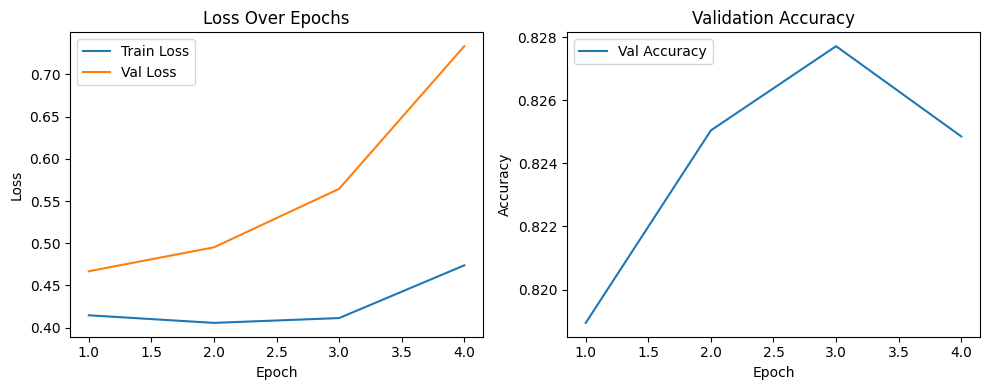

In [158]:
import matplotlib.pyplot as plt

# Extract accuracy and loss
eval_accuracy = [log["eval_accuracy"] for log in log_history if "eval_accuracy" in log]
eval_loss = [log["eval_loss"] for log in log_history if "eval_loss" in log]
train_loss = [log["loss"] for log in log_history if "loss" in log]

# Use index as epoch
epochs = list(range(1, len(eval_accuracy) + 1))

# Plot
plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_loss[:len(epochs)], label="Train Loss")
plt.plot(epochs, eval_loss, label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Loss Over Epochs")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, eval_accuracy, label="Val Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Validation Accuracy")
plt.legend()

plt.tight_layout()
plt.show()



## LIME

In [159]:
!pip install lime


In [2]:
from lime.lime_text import LimeTextExplainer


### BiLSTM

In [71]:
with open("lstm_no_stop_tokenizer.pkl", "rb") as f:
    tokenizer = pickle.load(f)
with open("lstm_no_stop_label_encoder.pkl", "rb") as f:
    label_encoder = pickle.load(f)

In [72]:
bilstm_model = load_model("bilstm_no_stop_model.h5")

# Load original test data
X_test = np.load("X_test_bilstm_no_stop.npy")
y_test = np.load("y_test_bilstm_no_stop.npy")

In [73]:
def lstm_predict_proba(texts):
    sequences = tokenizer.texts_to_sequences(texts)
    padded = pad_sequences(sequences, maxlen=150, padding='post', truncating='post')
    probs = bilstm_model.predict(padded)
    return probs


In [74]:
import numpy as np

def find_original_index(sample_sequence, all_sequences):
    for idx, seq in enumerate(all_sequences):
        if np.array_equal(seq, sample_sequence):
            return idx
    return None

i = 305  # index in X_test
class_index = y_test[i]
original_index = find_original_index(X_test[i], X)

if original_index is not None:
    text_instance = df['cleaned_statement_no_stop'].iloc[original_index]
    true_label = label_encoder.inverse_transform([y_test[i]])[0]

    print("TEXT:", text_instance)
    print("True Label:", true_label)

    exp = explainer.explain_instance(text_instance, lstm_predict_proba, num_features=10, labels=[class_index])
    exp.show_in_notebook()
else:
    print("Original index not found.")


TEXT: actually took shower cleaned room folded clothes signed classes applied pell grant college know normal stuff proud today baby steps overcoming depression everyday something today
True Label: Depression
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


In [36]:


i = 45
original_index = find_original_index(X_test[i], X)

if original_index is not None:
    text_instance = df['cleaned_statement_no_stop'].iloc[original_index]
    true_label = label_encoder.inverse_transform([y_test[i]])[0]

    print("TEXT:", text_instance)
    print("True Label:", true_label)

    exp = explainer.explain_instance(text_instance, lstm_predict_proba, num_features=10)
    exp.show_in_notebook()
else:
    print("Original index not found.")

TEXT: alydesigns wa day get much done
True Label: Normal
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


In [40]:


i = 20
original_index = find_original_index(X_test[i], X)
class_index = y_test[i]

if original_index is not None:
    text_instance = df['cleaned_statement_no_stop'].iloc[original_index]
    true_label = label_encoder.inverse_transform([y_test[i]])[0]

    print("TEXT:", text_instance)
    print("True Label:", true_label)

    exp = explainer.explain_instance(text_instance, lstm_predict_proba, labels=[class_index], num_features=10)
    exp.show_in_notebook()
else:
    print("Original index not found.")

TEXT: sincerely see living disaster salvation wait best happen option anymore try survive little id like tell something interesting ill live two years
True Label: Suicidal
157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


In [84]:
import numpy as np

def find_original_index(sample_sequence, all_sequences):
    for idx, seq in enumerate(all_sequences):
        if np.array_equal(seq, sample_sequence):
            return idx
    return None

i = 1722  # index in X_test
class_index = y_test[i]
original_index = find_original_index(X_test[i], X)

if original_index is not None:
    text_instance = df['cleaned_statement_no_stop'].iloc[original_index]
    true_label = label_encoder.inverse_transform([y_test[i]])[0]

    print("TEXT:", text_instance)
    print("True Label:", true_label)

    exp = explainer.explain_instance(text_instance, lstm_predict_proba, num_features=10, labels=[class_index])
    exp.show_in_notebook()
else:
    print("Original index not found.")

TEXT: anyone anything f going stressful depressive episode ever hardly get anything done best get maybe hours work done afternoon anxietystressdepression attack body decides shut literally hard move id collapse try stand cannot keep eyes open wears point afterwards lay try something low energy like reading get make sure least eat something spend time parents usually spend bit time work feeling particularly good hobbies like music art another attack night also productive maybe hours switch something low energy really low energy activity mostly reading fiction sometimes ill try play video games rare nowadays therapist knows working still got handle meantime though employed right remote volunteer work takes probably hours week get work done feel like seriously hanging thread also job searching honest idea ill hold full time job sure even really hold remote part time job truthfully considered least taking small freelance gigs difficult get going feel like making lot excuses since use autop

[4727   90    1    3    2  479   34  726  122    3  135   45    2    1
  443 1556  717    2  178 1584    1 1331  498   59  143 3788   66    1
  594   39   50 2447   55 1084  163  739  484 1515 1084  417   21   94
    1 2887  661  357  405   20  805  224  126 4205 1062  148    3   80
    7 1190  498   59  143    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0]


In [ ]:
explainer = LimeTextExplainer(class_names=class_names)


In [46]:
from collections import Counter
from tqdm import tqdm

# Create a dictionary to store aggregated LIME terms
lime_class_terms = {}




In [47]:
for class_id, class_name in enumerate(label_encoder.classes_):
    print(f"\n🔍 Analyzing class: {class_name}")
    term_counter = Counter()

    # Get indices of test samples for the class
    class_sample_indices = np.where(y_test == class_id)[0]
    selected_indices = np.random.choice(class_sample_indices, size=min(20, len(class_sample_indices)), replace=False)

    for i in tqdm(selected_indices):
        original_index = find_original_index(X_test[i], X)
        if original_index is None:
            continue

        text_instance = df['cleaned_statement_no_stop'].iloc[original_index]
        
        try:
            exp = explainer.explain_instance(text_instance, lstm_predict_proba, labels=[class_id], num_features=10)
            terms = dict(exp.as_list(label=class_id))
            term_counter.update(terms)
        except:
            continue
        lime_class_terms[class_name] = term_counter.most_common(10)
        



🔍 Analyzing class: Anxiety


  0%|          | 0/20 [00:00<?, ?it/s]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


  5%|▌         | 1/20 [00:01<00:25,  1.34s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 10%|█         | 2/20 [00:02<00:25,  1.42s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 15%|█▌        | 3/20 [00:04<00:24,  1.42s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 20%|██        | 4/20 [00:05<00:20,  1.29s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 25%|██▌       | 5/20 [00:06<00:18,  1.26s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 30%|███       | 6/20 [00:08<00:20,  1.47s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 35%|███▌      | 7/20 [00:09<00:18,  1.44s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 40%|████      | 8/20 [00:11<00:16,  1.41s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 45%|████▌     | 9/20 [00:12<00:14,  1.35s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 50%|█████     | 10/20 [00:13<00:13,  1.37s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 55%|█████▌    | 11/20 [00:15<00:12,  1.34s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 60%|██████    | 12/20 [00:16<00:10,  1.26s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 65%|██████▌   | 13/20 [00:17<00:08,  1.20s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 70%|███████   | 14/20 [00:18<00:07,  1.30s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 75%|███████▌  | 15/20 [00:20<00:06,  1.30s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 80%|████████  | 16/20 [00:21<00:05,  1.27s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 85%|████████▌ | 17/20 [00:22<00:03,  1.24s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 90%|█████████ | 18/20 [00:23<00:02,  1.17s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 95%|█████████▌| 19/20 [00:24<00:01,  1.29s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


100%|██████████| 20/20 [00:26<00:00,  1.33s/it]



🔍 Analyzing class: Bipolar


  0%|          | 0/20 [00:00<?, ?it/s]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


  5%|▌         | 1/20 [00:01<00:24,  1.31s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 10%|█         | 2/20 [00:02<00:22,  1.26s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 15%|█▌        | 3/20 [00:04<00:23,  1.36s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 20%|██        | 4/20 [00:05<00:20,  1.29s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 25%|██▌       | 5/20 [00:06<00:18,  1.27s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 30%|███       | 6/20 [00:08<00:20,  1.50s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 35%|███▌      | 7/20 [00:09<00:20,  1.54s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 40%|████      | 8/20 [00:11<00:19,  1.62s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 45%|████▌     | 9/20 [00:13<00:17,  1.60s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 50%|█████     | 10/20 [00:14<00:15,  1.55s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 55%|█████▌    | 11/20 [00:16<00:13,  1.55s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 60%|██████    | 12/20 [00:17<00:12,  1.56s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 65%|██████▌   | 13/20 [00:19<00:11,  1.60s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 70%|███████   | 14/20 [00:20<00:09,  1.51s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 75%|███████▌  | 15/20 [00:22<00:07,  1.46s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 80%|████████  | 16/20 [00:23<00:05,  1.46s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 85%|████████▌ | 17/20 [00:25<00:04,  1.48s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 90%|█████████ | 18/20 [00:26<00:02,  1.44s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 95%|█████████▌| 19/20 [00:27<00:01,  1.39s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


100%|██████████| 20/20 [00:29<00:00,  1.47s/it]



🔍 Analyzing class: Depression


  0%|          | 0/20 [00:00<?, ?it/s]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


  5%|▌         | 1/20 [00:01<00:23,  1.23s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 10%|█         | 2/20 [00:02<00:22,  1.24s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 15%|█▌        | 3/20 [00:04<00:23,  1.37s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 20%|██        | 4/20 [00:05<00:21,  1.31s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 25%|██▌       | 5/20 [00:06<00:20,  1.37s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 30%|███       | 6/20 [00:08<00:20,  1.47s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 35%|███▌      | 7/20 [00:09<00:18,  1.41s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 40%|████      | 8/20 [00:10<00:16,  1.38s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 45%|████▌     | 9/20 [00:12<00:16,  1.52s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 50%|█████     | 10/20 [00:14<00:14,  1.45s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 55%|█████▌    | 11/20 [00:15<00:12,  1.41s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 60%|██████    | 12/20 [00:17<00:11,  1.49s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 65%|██████▌   | 13/20 [00:18<00:09,  1.39s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 70%|███████   | 14/20 [00:19<00:08,  1.34s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 75%|███████▌  | 15/20 [00:20<00:06,  1.34s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 80%|████████  | 16/20 [00:22<00:05,  1.33s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 85%|████████▌ | 17/20 [00:23<00:03,  1.33s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 90%|█████████ | 18/20 [00:24<00:02,  1.26s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 95%|█████████▌| 19/20 [00:25<00:01,  1.26s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


100%|██████████| 20/20 [00:27<00:00,  1.36s/it]



🔍 Analyzing class: Normal


  0%|          | 0/20 [00:00<?, ?it/s]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


  5%|▌         | 1/20 [00:01<00:20,  1.10s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 10%|█         | 2/20 [00:02<00:20,  1.16s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 15%|█▌        | 3/20 [00:03<00:19,  1.12s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 20%|██        | 4/20 [00:04<00:18,  1.13s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 25%|██▌       | 5/20 [00:05<00:17,  1.17s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 30%|███       | 6/20 [00:06<00:16,  1.17s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 35%|███▌      | 7/20 [00:08<00:17,  1.32s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 40%|████      | 8/20 [00:09<00:14,  1.23s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 45%|████▌     | 9/20 [00:10<00:12,  1.16s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 50%|█████     | 10/20 [00:11<00:11,  1.14s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 55%|█████▌    | 11/20 [00:12<00:10,  1.16s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 60%|██████    | 12/20 [00:13<00:09,  1.13s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 65%|██████▌   | 13/20 [00:15<00:07,  1.11s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 70%|███████   | 14/20 [00:16<00:06,  1.14s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 75%|███████▌  | 15/20 [00:17<00:05,  1.14s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 80%|████████  | 16/20 [00:18<00:04,  1.15s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 85%|████████▌ | 17/20 [00:19<00:03,  1.11s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 90%|█████████ | 18/20 [00:20<00:02,  1.12s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 95%|█████████▌| 19/20 [00:21<00:01,  1.11s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


100%|██████████| 20/20 [00:22<00:00,  1.15s/it]



🔍 Analyzing class: Personality disorder


  0%|          | 0/20 [00:00<?, ?it/s]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


  5%|▌         | 1/20 [00:01<00:28,  1.50s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 10%|█         | 2/20 [00:03<00:29,  1.65s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 15%|█▌        | 3/20 [00:04<00:25,  1.52s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 20%|██        | 4/20 [00:06<00:23,  1.49s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 25%|██▌       | 5/20 [00:07<00:23,  1.55s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 30%|███       | 6/20 [00:09<00:21,  1.55s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 35%|███▌      | 7/20 [00:10<00:19,  1.49s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 40%|████      | 8/20 [00:12<00:17,  1.46s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 45%|████▌     | 9/20 [00:13<00:15,  1.38s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 50%|█████     | 10/20 [00:14<00:13,  1.36s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 55%|█████▌    | 11/20 [00:15<00:11,  1.33s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 60%|██████    | 12/20 [00:17<00:10,  1.31s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 65%|██████▌   | 13/20 [00:18<00:09,  1.33s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 70%|███████   | 14/20 [00:19<00:07,  1.32s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 75%|███████▌  | 15/20 [00:20<00:06,  1.28s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 80%|████████  | 16/20 [00:22<00:05,  1.29s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 85%|████████▌ | 17/20 [00:23<00:04,  1.35s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 90%|█████████ | 18/20 [00:25<00:02,  1.39s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 95%|█████████▌| 19/20 [00:26<00:01,  1.41s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


100%|██████████| 20/20 [00:28<00:00,  1.41s/it]



🔍 Analyzing class: Stress


  0%|          | 0/20 [00:00<?, ?it/s]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


  5%|▌         | 1/20 [00:01<00:27,  1.46s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 10%|█         | 2/20 [00:02<00:23,  1.31s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 15%|█▌        | 3/20 [00:03<00:22,  1.29s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 20%|██        | 4/20 [00:05<00:21,  1.32s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 25%|██▌       | 5/20 [00:06<00:19,  1.30s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 30%|███       | 6/20 [00:08<00:19,  1.42s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 35%|███▌      | 7/20 [00:09<00:17,  1.35s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 40%|████      | 8/20 [00:10<00:15,  1.32s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 45%|████▌     | 9/20 [00:11<00:14,  1.29s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 50%|█████     | 10/20 [00:13<00:13,  1.31s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 55%|█████▌    | 11/20 [00:14<00:11,  1.30s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 60%|██████    | 12/20 [00:15<00:10,  1.27s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 65%|██████▌   | 13/20 [00:17<00:10,  1.56s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 70%|███████   | 14/20 [00:19<00:08,  1.49s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 75%|███████▌  | 15/20 [00:20<00:07,  1.41s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 80%|████████  | 16/20 [00:21<00:05,  1.40s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 85%|████████▌ | 17/20 [00:23<00:04,  1.41s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 90%|█████████ | 18/20 [00:24<00:02,  1.38s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 95%|█████████▌| 19/20 [00:26<00:01,  1.40s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


100%|██████████| 20/20 [00:27<00:00,  1.37s/it]



🔍 Analyzing class: Suicidal


  0%|          | 0/20 [00:00<?, ?it/s]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


  5%|▌         | 1/20 [00:01<00:23,  1.23s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 10%|█         | 2/20 [00:02<00:21,  1.22s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 15%|█▌        | 3/20 [00:03<00:20,  1.18s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 20%|██        | 4/20 [00:04<00:19,  1.20s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 25%|██▌       | 5/20 [00:05<00:17,  1.16s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 30%|███       | 6/20 [00:06<00:15,  1.14s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 35%|███▌      | 7/20 [00:08<00:16,  1.25s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 40%|████      | 8/20 [00:10<00:16,  1.37s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 45%|████▌     | 9/20 [00:11<00:14,  1.31s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 50%|█████     | 10/20 [00:12<00:13,  1.30s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 55%|█████▌    | 11/20 [00:13<00:11,  1.25s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 60%|██████    | 12/20 [00:14<00:09,  1.24s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 65%|██████▌   | 13/20 [00:16<00:08,  1.22s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 70%|███████   | 14/20 [00:17<00:07,  1.28s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 75%|███████▌  | 15/20 [00:18<00:06,  1.24s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 80%|████████  | 16/20 [00:20<00:05,  1.28s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 85%|████████▌ | 17/20 [00:21<00:03,  1.23s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 90%|█████████ | 18/20 [00:22<00:02,  1.33s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


 95%|█████████▌| 19/20 [00:23<00:01,  1.29s/it]

157/157 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


100%|██████████| 20/20 [00:25<00:00,  1.26s/it]


In [51]:
# Display the class-specific signature terms
for clss, terms in lime_class_terms.items():
    print(f"\nTop LIME terms for class '{clss}':")
    for term, score in terms:
        print(f"  {term}: {score:.2f}")


Top LIME terms for class 'Anxiety':
  anxiety: 1.03
  restless: 0.90
  symptoms: 0.88
  restlessness: 0.77
  heart: 0.56
  freaking: 0.54
  nervous: 0.34
  f: 0.33
  pop: 0.29
  fear: 0.27

Top LIME terms for class 'Bipolar':
  bipolar: 3.26
  episode: 1.03
  manic: 1.02
  mixed: 0.71
  lithium: 0.71
  bp: 0.49
  mania: 0.44
  lamictal: 0.35
  episodes: 0.33
  pdoc: 0.33

Top LIME terms for class 'Depression':
  depression: 2.07
  wa: 0.54
  ha: 0.35
  feel: 0.34
  fuck: 0.27
  anything: 0.25
  year: 0.22
  attack: 0.22
  vent: 0.21
  closest: 0.17

Top LIME terms for class 'Normal':
  eyes: 0.17
  latest: 0.17
  home: 0.16
  us: 0.14
  believe: 0.13
  work: 0.11
  far: 0.09
  loves: 0.08
  relationship: 0.06
  kaschua: 0.05

Top LIME terms for class 'Personality disorder':
  avpd: 2.81
  avoidant: 0.30
  anyone: 0.14
  concerns: 0.12
  experiences: 0.10
  stories: 0.09
  therapist: 0.08
  identify: 0.08
  stable: 0.07
  missing: 0.06

Top LIME terms for class 'Stress':
  stress: 3.72

<ipython-input-53-b89974e4d9c4>:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


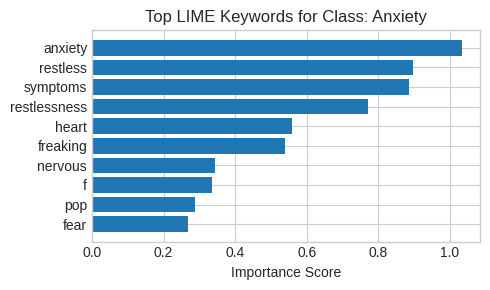

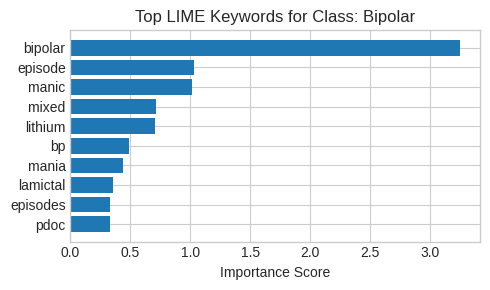

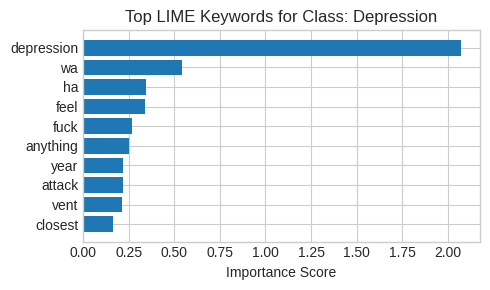

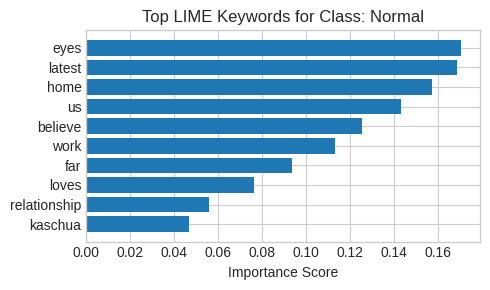

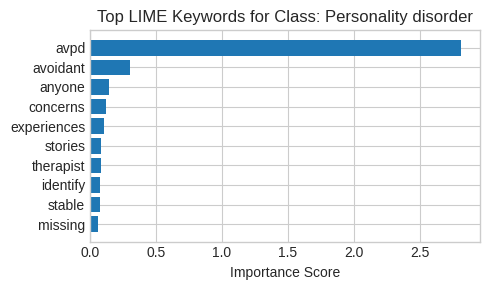

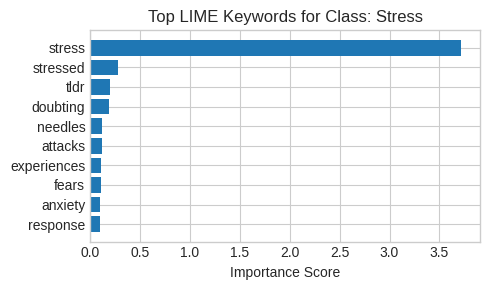

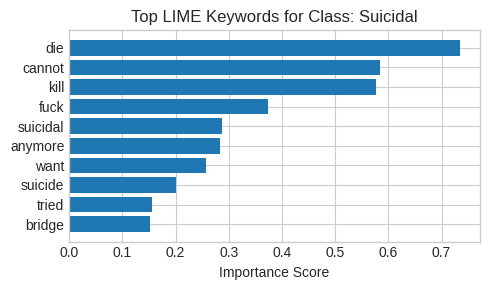

In [53]:
import matplotlib.pyplot as plt

# Set up matplotlib styling
plt.style.use('seaborn-whitegrid')
plt.rcParams["figure.figsize"] = (5, 3)

# Plot for each class
for cls, terms in lime_class_terms.items():
    terms_list, scores = zip(*terms)
    plt.figure()
    plt.barh(terms_list[::-1], scores[::-1])
    plt.title(f"Top LIME Keywords for Class: {cls}")
    plt.xlabel("Importance Score")
    plt.tight_layout()
    plt.show()


### BERT


In [95]:
from lime.lime_text import LimeTextExplainer
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from sklearn.preprocessing import LabelEncoder
import torch
import numpy as np
import pickle


In [96]:
tokenizer = AutoTokenizer.from_pretrained("bert_tokenizer_v1")
model = AutoModelForSequenceClassification.from_pretrained("bert_model_v1")
with open("bert_label_encoder.pkl", "rb") as f:
    label_encoder = pickle.load(f)
class_names = label_encoder.classes_.tolist()

In [111]:
device = torch.device("cuda")

In [137]:
model.to(device)
model.eval()

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [138]:
def predict_proba(texts):
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=128)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
        probs = torch.nn.functional.softmax(outputs.logits, dim=1).cpu().numpy()
        logits = outputs.logits
    return probs.cpu().numpy()  # Return to CPU for LIME compatibility



In [139]:
explainer = LimeTextExplainer(class_names=class_names)

In [140]:
# open test data
import json
with open("bert_test_data.json", "r") as f:
    test_data = json.load(f)


In [101]:
i = 10
text_instance = test_data["texts"][i]
true_label = label_encoder.inverse_transform([int(test_data["labels"][i])])[0]

In [67]:

print("TEXT:", text_instance)
print("True Label:", true_label)

# Get predicted class index (int) for the sample
probs = predict_proba([text_instance])
predicted_class = int(np.argmax(probs))

# Then call LIME with labels=[predicted_class]
exp = explainer.explain_instance(
    text_instance,
    predict_proba,  
    labels=[predicted_class],
    num_features=10,
    num_samples=100 
)

exp.show_in_notebook()

TEXT: Out of nowhere came this wave of manic feeling and a need to be active and doing things which is very distressing because I know this is the only other feeling I am going to feel other than the depression or the nothingness that I basically feel everyday but I am so psychologically exhausted that I do not even know how to "enjoy" my manic phase now feeling manic
True Label: Depression


In [104]:
i = 44
text_instance = test_data["texts"][i]
true_label = label_encoder.inverse_transform([int(test_data["labels"][i])])[0]

In [ ]:
test_labels = label_encoder.inverse_transform(test_data["labels"])

In [106]:

print("TEXT:", text_instance)
print("True Label:", true_label)

# Get predicted class index (int) for the sample
probs = predict_proba([text_instance])
predicted_class = int(np.argmax(probs))

# Then call LIME with labels=[predicted_class]
exp = explainer.explain_instance(
    text_instance,
    predict_proba,  
    labels=[predicted_class],
    num_features=10,
    num_samples=100 
)

exp.show_in_notebook()

TEXT: Motivation Maybe I'm just pathetic, but I feel like I need someone in my life for motivation. I once had someone interested in me (I think anyway lol) and I was the most motivated I had ever been in my whole life. If you're just alone, it's hard to say motivated IMO. I realize this is probably a flawed way of thinking, and I know that you shouldn't rely on other people, but I just feel like I need someone to give me that spark. I feel like a hopeless romantic with zero romantic experience.
True Label: Personality disorder


In [108]:
from lime.lime_text import LimeTextExplainer
from collections import defaultdict, Counter
import numpy as np
import torch


In [142]:


def bert_predict_proba(texts):
    inputs = tokenizer(texts, padding=True, truncation=True, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}  # Move all to GPU
    model.to(device)  # Ensure model is also on the same device
    
    with torch.no_grad():
        outputs = model(**inputs)
        logits = outputs.logits
        probs = torch.nn.functional.softmax(logits, dim=1)
    
    return probs.cpu().numpy()  # Return to CPU for LIME compatibility


In [143]:
class_keywords = defaultdict(Counter)

In [144]:
test_labels = test_data["labels"]
test_texts = test_data["texts"]


In [145]:
samples_per_class = 30
for class_id, class_name in enumerate(label_encoder.classes_):
    class_indices = [i for i, y in enumerate(test_labels) if y == class_id]
    chosen_indices = np.random.choice(class_indices, size=min(samples_per_class, len(class_indices)), replace=False)

    for i in chosen_indices:
        text = test_texts[i]
        explanation = explainer.explain_instance(text, bert_predict_proba, labels=[class_id], num_features=10,num_samples=100)
        for word, weight in explanation.as_list(label=class_id):
            class_keywords[class_name][word] += abs(weight)


In [146]:
top_k = 10
for cls, keywords in class_keywords.items():
    print(f"\n🔍 Top LIME terms for class '{cls}':")
    for word, score in keywords.most_common(top_k):
        print(f"  {word}: {round(score, 2)}")


🔍 Top LIME terms for class 'Anxiety':
  restless: 2.64
  anxiety: 1.47
  Restless: 0.89
  nervous: 0.87
  s: 0.69
  symptoms: 0.47
  stress: 0.43
  Feeling: 0.41
  Stress: 0.39
  had: 0.38

🔍 Top LIME terms for class 'Bipolar':
  bipolar: 5.31
  manic: 0.92
  I: 0.91
  Bipolar: 0.69
  t: 0.59
  s: 0.56
  seroquel: 0.54
  Mania: 0.43
  meds: 0.38
  m: 0.36

🔍 Top LIME terms for class 'Depression':
  depression: 2.11
  t: 0.59
  I: 0.31
  suicidal: 0.29
  have: 0.29
  OCD: 0.27
  feel: 0.27
  anymore: 0.26
  cashier: 0.25
  and: 0.25

🔍 Top LIME terms for class 'Normal':
  kills: 0.38
  I: 0.18
  owed: 0.13
  a: 0.08
  when: 0.08
  all: 0.06
  15: 0.06
  drive: 0.06
  you: 0.06
  doesn: 0.06

🔍 Top LIME terms for class 'Personality disorder':
  AvPD: 4.57
  AVPD: 2.02
  avpd: 1.27
  avoid: 0.94
  I: 0.81
  to: 0.69
  m: 0.52
  awkward: 0.51
  avoidant: 0.47
  t: 0.43

🔍 Top LIME terms for class 'Stress':
  stress: 3.82
  stressed: 2.08
  I: 1.5
  Stress: 0.93
  and: 0.6
  m: 0.56
  to: 

In [147]:
#visualize the keywords
# Convert Counter to list of (word, score) pairs
top_k = 10
lime_class_terms = {
    cls: keywords.most_common(top_k)
    for cls, keywords in class_keywords.items()
}


<ipython-input-148-37e8b9739edd>:4: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


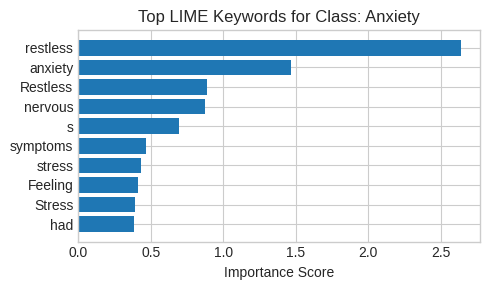

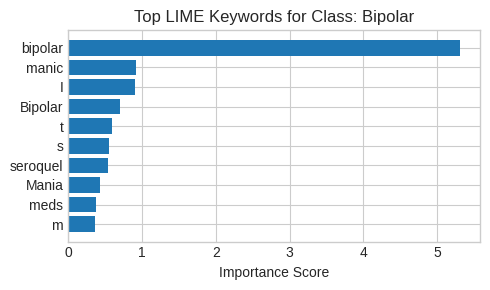

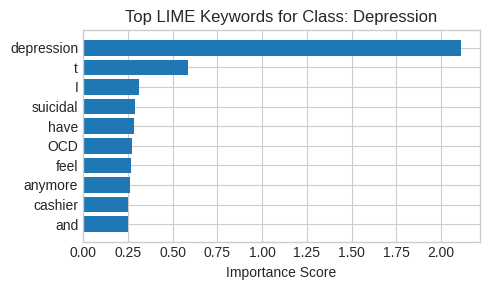

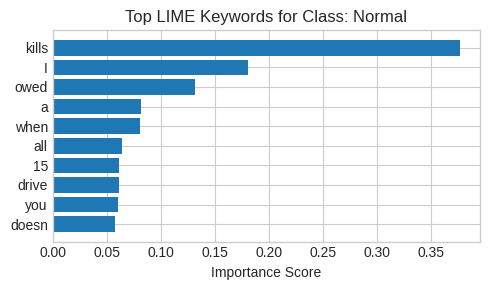

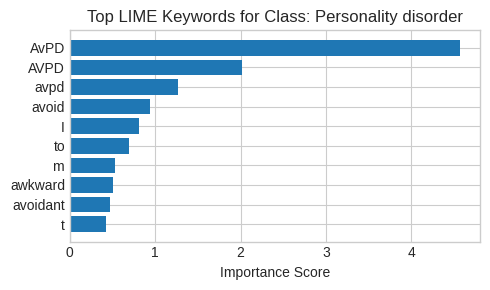

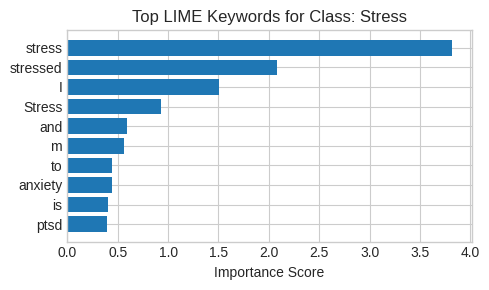

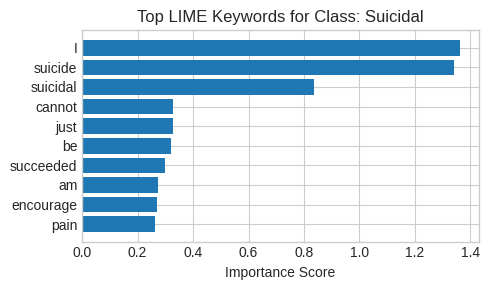

In [148]:
import matplotlib.pyplot as plt

# Styling
plt.style.use('seaborn-whitegrid')
plt.rcParams["figure.figsize"] = (5, 3)

# Plot
for cls, terms in lime_class_terms.items():
    terms_list, scores = zip(*terms)
    plt.figure()
    plt.barh(terms_list[::-1], scores[::-1])
    plt.title(f"Top LIME Keywords for Class: {cls}")
    plt.xlabel("Importance Score")
    plt.tight_layout()
    plt.show()


## SHAP

In [11]:
import numpy as np
import pandas as pd
import pickle
from collections import defaultdict, Counter
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import load_model
import shap

### BiLSTM 

In [12]:
with open("lstm_no_stop_tokenizer.pkl", "rb") as f:
    tokenizer = pickle.load(f)
with open("lstm_no_stop_label_encoder.pkl", "rb") as f:
    label_encoder = pickle.load(f)



In [13]:
bilstm_model = load_model("bilstm_no_stop_model.h5")

X_test = np.load("X_test_bilstm_no_stop.npy")
y_test = np.load("y_test_bilstm_no_stop.npy")


In [14]:
df = df[df['cleaned_statement_no_stop'].notnull()].reset_index(drop=True)
texts = df['cleaned_statement_no_stop'].tolist()

In [15]:
def predict_fn_numeric(x):
    return bilstm_model.predict(x)

In [ ]:

# Use a subset of the numeric test sequences as background data.
background = X_test[:100]

explainer = shap.KernelExplainer(predict_fn_numeric, background)


4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


In [ ]:
#map to the index back to word
index_word = {v: k for k, v in tokenizer.word_index.items()}

def tokens_from_sequence(seq):#converts sequcnes into tokens
    return [index_word.get(idx, "") for idx in seq if idx != 0]

In [ ]:
samples_per_class = 10 
class_keywords = defaultdict(Counter)

In [20]:
np.random.seed(22)


In [21]:
# Iterate over each class in the label encoder.
for class_id, class_name in enumerate(label_encoder.classes_):
    # Get indices of test samples belonging to the current class.
    indices = np.where(y_test == class_id)[0]
    if len(indices) > samples_per_class:
        indices = np.random.choice(indices, size=samples_per_class, replace=False)
    
    for idx in indices:
        sample_seq = X_test[idx]
        shap_vals = explainer.shap_values(np.array([sample_seq]), nsamples=100)
        shap_val_sample = shap_vals[class_id][0]  
        tokens = tokens_from_sequence(sample_seq)
        shap_val_sample_trimmed = shap_val_sample[:len(tokens)]
        
        for token, val in zip(tokens, shap_val_sample_trimmed):
            class_keywords[class_name][token] += abs(val)


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 131 iterations, alpha=9.263e-04, previous alpha=9.263e-04, with an active set of 38 regressors.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 38 iterations, alpha=8.991e-04, previous alpha=8.367e-04, with an active set of 27 regressors.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 31 iterations, alpha=1.377e-03, previous alpha=1.346e-03, with an active set of 22 regressors.
Linear regression equation is singular, a least squares solutions is used instead.
To avoid this situation and get a regular matrix do one of the following:
1) turn up the number of samples,
2) turn up the L1 regularization with num_features(N) where N is less than the number of samples,
3) group features together to reduce the number of inputs that need to be 

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 19 iterations, alpha=2.311e-02, previous alpha=2.311e-02, with an active set of 14 regressors.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=2.381e-02, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 11 iterations, i.e. alpha=8.409e-03, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 27 iterations, alpha=4.172e-03, previous alpha=4.163e-03, with an active set of 20 regressors.


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 31 iterations, alpha=9.503e-04, previous alpha=9.448e-04, with an active set of 28 regressors.
Regressors in active set degenerate. Dropping a regressor, after 9 iterations, i.e. alpha=1.354e-02, with an active set of 7 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 106 iterations, alpha=2.696e-03, previous alpha=2.692e-03, with an active set of 35 regressors.


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=4.232e-02, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 103 iterations, alpha=7.122e-03, previous alpha=6.843e-03, with an active set of 32 regressors.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=2.191e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=4.475e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 ite

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 28 iterations, alpha=5.928e-04, previous alpha=5.877e-04, with an active set of 17 regressors.


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 102 iterations, alpha=1.639e-07, previous alpha=1.636e-07, with an active set of 51 regressors.


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 32 iterations, alpha=7.912e-04, previous alpha=5.922e-04, with an active set of 19 regressors.
Linear regression equation is singular, a least squares solutions is used instead.
To avoid this situation and get a regular matrix do one of the following:
1) turn up the number of samples,
2) turn up the L1 regularization with num_features(N) where N is less than the number of samples,
3) group features together to reduce the number of inputs that need to be explained.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 60 iterations, alpha=1.878e-03, previous alpha=1.576e-03, with an active set of 25 regressors.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 23 iterations, alpha=2.715e-03, previous alpha=2.057e-03, with an active set of 18 re

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Regressors in active set degenerate. Dropping a regressor, after 29 iterations, i.e. alpha=7.144e-04, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 32 iterations, i.e. alpha=4.842e-04, with an active set of 24 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 45 iterations, i.e. alpha=2.596e-04, with an active set of 31 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 75 iterations, alpha=1.263e-04, previous alpha=1.251e-04, with an active set of 38 regressors.
Early stopping the lars path, as the residues are small and the curr

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 116 iterations, alpha=2.297e-05, previous alpha=2.297e-05, with an active set of 45 regressors.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 21 iterations, alpha=1.309e-02, previous alpha=1.275e-02, with an active set of 16 regressors.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 110 iterations, alpha=8.957e-04, previous alpha=8.957e-04, with an active set of 37 regressors.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 153 iterations, alpha=4.582e-06, previous alpha=4.582e-06, with an active set of 46 regressors.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 135 iterations, alpha=6.485e-05,

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Regressors in active set degenerate. Dropping a regressor, after 6 iterations, i.e. alpha=8.859e-03, with an active set of 6 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 11 iterations, alpha=5.247e-03, previous alpha=5.234e-03, with an active set of 8 regressors.
Linear regression equation is singular, a least squares solutions is used instead.
To avoid this situation and get a regular matrix do one of the following:
1) turn up the number of samples,
2) turn up the L1 regularization with num_features(N) where N is less than the number of samples,
3) group features together to reduce the number of inputs that need to be explained.
Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=7.824e-03, with an active set of 1 regressors, and the smallest cholesky pivot element 

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Regressors in active set degenerate. Dropping a regressor, after 33 iterations, i.e. alpha=1.048e-03, with an active set of 19 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 41 iterations, i.e. alpha=5.240e-04, with an active set of 25 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 42 iterations, i.e. alpha=4.798e-04, with an active set of 26 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 45 iterations, alpha=4.407e-04, previous alpha=4.375e-04, with an active set of 28 regressors.
Early stopping the lars path, as the residues are small and the curr

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 37 iterations, alpha=1.654e-03, previous alpha=1.654e-03, with an active set of 18 regressors.
Linear regression equation is singular, a least squares solutions is used instead.
To avoid this situation and get a regular matrix do one of the following:
1) turn up the number of samples,
2) turn up the L1 regularization with num_features(N) where N is less than the number of samples,
3) group features together to reduce the number of inputs that need to be explained.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 45 iterations, alpha=5.955e-05, previous alpha=5.053e-05, with an active set of 38 regressors.
Regressors in active set degenerate. Dropping a regressor, after 35 iterations, i.e. alpha=3.852e-04, with an active set of 25 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 37 iterations, alpha=3.029e-03, previous alpha=2.661e-03, with an active set of 20 regressors.
Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=3.804e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 87 iterations, alpha=7.308e-03, previous alpha=7.308e-03, with an active set of 38 regressors.
Regressors in active set degenerate. Dropping a regressor, after 21 iterations, i.e. alpha=2.000e-03, with an active set of 21 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 68 iterations, i.e. alpha=3.588e-

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Regressors in active set degenerate. Dropping a regressor, after 8 iterations, i.e. alpha=1.278e-02, with an active set of 8 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Regressors in active set degenerate. Dropping a regressor, after 12 iterations, i.e. alpha=6.388e-03, with an active set of 12 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 13 iterations, alpha=6.388e-03, previous alpha=6.360e-03, with an active set of 12 regressors.
Regressors in active set degenerate. Dropping a regressor, after 7 iterations, i.e. alpha=5.764e-02, with an active set of 5 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current 

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 47 iterations, alpha=4.096e-04, previous alpha=4.086e-04, with an active set of 26 regressors.
Regressors in active set degenerate. Dropping a regressor, after 3 iterations, i.e. alpha=9.014e-03, with an active set of 3 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no longer well controlled. 109 iterations, alpha=1.400e-03, previous alpha=1.400e-03, with an active set of 36 regressors.
Regressors in active set degenerate. Dropping a regressor, after 22 iterations, i.e. alpha=1.701e-03, with an active set of 20 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.
Early stopping the lars path, as the residues are small and the current value of alpha is no long

  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step


In [22]:
top_k = 10  # Number of top tokens to show per class
for cls, counter in class_keywords.items():
    print(f"\nTop SHAP keywords for class '{cls}':")
    for token, score in counter.most_common(top_k):
        print(f"  {token}: {round(score, 2)}")


Top SHAP keywords for class 'Anxiety':
  nervous: 0.63
  washing: 0.57
  anxiety: 0.48
  scared: 0.34
  psych: 0.25
  however: 0.21
  cant: 0.18
  day: 0.17
  hiv: 0.17
  instantly: 0.17

Top SHAP keywords for class 'Bipolar':
  bipolar: 0.73
  mania: 0.51
  <OOV>: 0.34
  bp: 0.29
  episode: 0.27
  im: 0.2
  manic: 0.19
  lithium: 0.15
  seroquel: 0.15
  got: 0.14

Top SHAP keywords for class 'Depression':
  depression: 1.18
  wish: 0.35
  wa: 0.24
  <OOV>: 0.17
  people: 0.11
  care: 0.1
  wake: 0.1
  ativan: 0.09
  none: 0.07
  0: 0.07

Top SHAP keywords for class 'Normal':
  <OOV>: 0.4
  hour: 0.2
  present: 0.16
  whats: 0.11
  really: 0.11
  future: 0.07
  blue: 0.07
  0: 0.06
  sure: 0.06
  come: 0.06

Top SHAP keywords for class 'Personality disorder':
  avpd: 0.83
  dae: 0.36
  avoidant: 0.26
  im: 0.16
  dont: 0.14
  uncomfortable: 0.12
  presence: 0.1
  work: 0.08
  <OOV>: 0.07
  ive: 0.07

Top SHAP keywords for class 'Stress':
  stress: 1.05
  everything: 0.21
  dont: 0.2
 

The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.


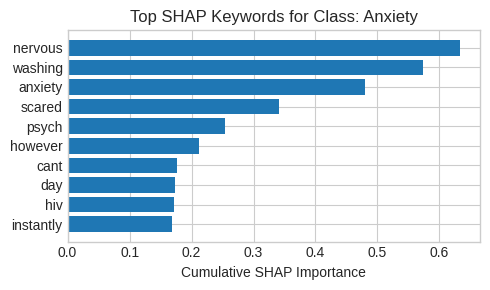

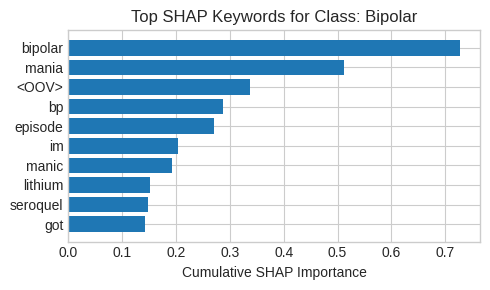

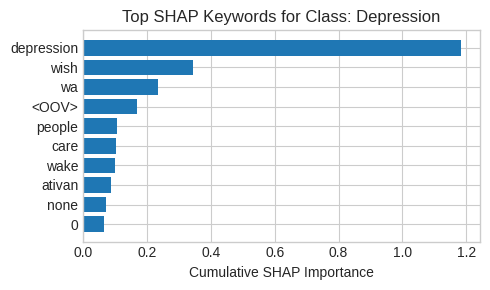

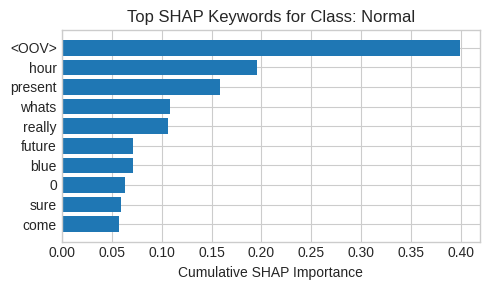

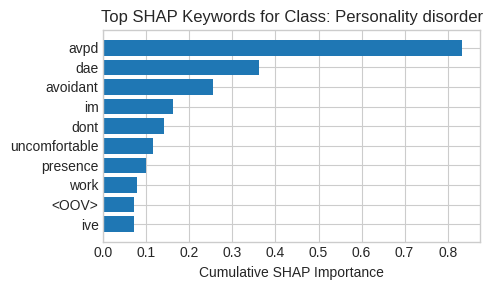

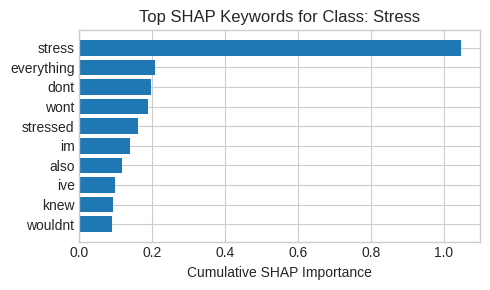

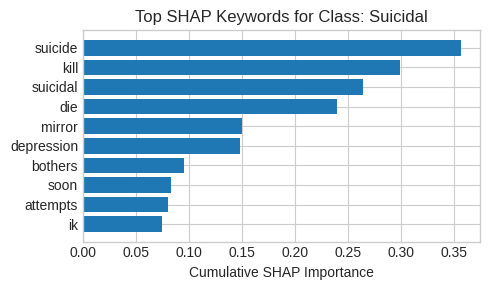

In [23]:
import matplotlib.pyplot as plt

# Set up matplotlib styling
plt.style.use('seaborn-whitegrid')
plt.rcParams["figure.figsize"] = (5, 3)

# Plot for each class using aggregated SHAP keywords stored in class_keywords
top_k = 10  # number of top tokens to display per class

for cls, counter in class_keywords.items():
    # Get the top tokens for the class
    top_terms = counter.most_common(top_k)
    if not top_terms:
        continue
    terms, scores = zip(*top_terms)
    plt.figure()
    plt.barh(terms[::-1], scores[::-1])
    plt.title(f"Top SHAP Keywords for Class: {cls}")
    plt.xlabel("Cumulative SHAP Importance")
    plt.tight_layout()
    plt.show()


In [47]:
sample_index = 10

# Get model prediction and SHAP values
input_ids = X_test[sample_index]
prediction = bilstm_model.predict(np.array([input_ids]))
predicted_class = np.argmax(prediction)

# Explain the sample
shap_values = explainer.shap_values(X_test[sample_index:sample_index+1])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


  0%|          | 0/1 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
7338/7338 ━━━━━━━━━━━━━━━━━━━━ 30s 4ms/step


In [48]:
tokens = [index_word.get(i, '') for i in input_ids if i != 0]
shap_vals_trimmed = shap_values[predicted_class][0][:len(tokens)]


In [49]:
print("Sample Text:")
print(' '.join(tokens))



Sample Text:
aware our terrifying hit been they rock like <OOV> the been do to all challenge took to another <OOV> ones am the experience hit dr been hit


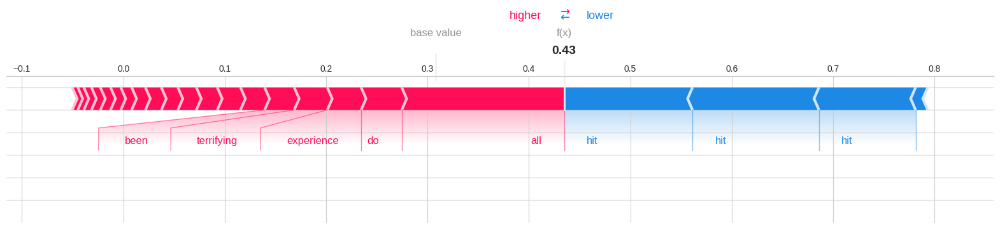

In [50]:
# Force plot
shap.force_plot(
    base_value=explainer.expected_value[predicted_class],
    shap_values=shap_vals_trimmed,
    features=tokens,
    matplotlib=True
)

In [51]:
# Get predicted class
pred_class_idx = np.argmax(bilstm_model.predict(np.array([X_test[sample_index]])))
predicted_class_name = label_encoder.inverse_transform([pred_class_idx])[0]

# Print to match the plot
print(f"Predicted class: {predicted_class_name}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted class: Depression


### BERT

In [108]:
tokenizer = AutoTokenizer.from_pretrained("bert_tokenizer_v1")
model = AutoModelForSequenceClassification.from_pretrained("bert_model_v1")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

BertForSequenceClassification(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e

In [109]:

with open("bert_label_encoder.pkl", "rb") as f:
    label_encoder = pickle.load(f)
class_names = label_encoder.classes_.tolist()

In [110]:
df = pd.read_csv("cleaned_mental_health_data.csv")
df = df[df['statement'].notnull()].reset_index(drop=True)
df = df[df['statement'].str.strip() != '']
test_texts = df['statement'].tolist()


In [111]:
def bert_predict_proba(texts):
    # Ensure texts is a list of strings.
    if isinstance(texts, np.ndarray) and len(texts.shape) == 2 and texts.shape[1] == 1:
        texts = texts.flatten().tolist()
    inputs = tokenizer(texts, padding=True, truncation=True, max_length=128, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
    probs = torch.nn.functional.softmax(outputs.logits, dim=1)
    return probs.cpu().numpy()




In [96]:
background_texts = np.random.choice(test_texts, size=100, replace=False)
# Convert to NumPy array with shape (N, 1)
background_array = np.array(background_texts).reshape(-1, 1)

In [112]:
background_texts = np.random.choice(test_texts, size=100, replace=False)
background_array = np.array(background_texts).reshape(-1, 1)
explainer = shap.KernelExplainer(bert_predict_proba, background_array, link="logit")


In [118]:
sample_index = 10  # adjust as needed
sample_text = test_texts[sample_index]
pred_probs = bert_predict_proba([sample_text])
predicted_class = int(np.argmax(pred_probs))
print("Sample Text:", sample_text)
print("Predicted Class:", label_encoder.inverse_transform([predicted_class])[0])


Sample Text: always restless every night, even though I don't know why, what's wrong. strange.
Predicted Class: Anxiety


In [119]:
sample_array = np.array([sample_text]).reshape(-1, 1)
shap_values = explainer.shap_values(sample_array, nsamples=50)


  0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
tokens = tokenizer.tokenize(sample_text)
tokens = [token for token in tokens if token not in ['[CLS]', '[SEP]']]


In [122]:
num_features = len(shap_values[predicted_class][0])
if len(tokens) > num_features:
    tokens = tokens[:num_features]
elif len(tokens) < num_features:
    tokens = tokens + [""] * (num_features - len(tokens))

divide by zero encountered in scalar divide


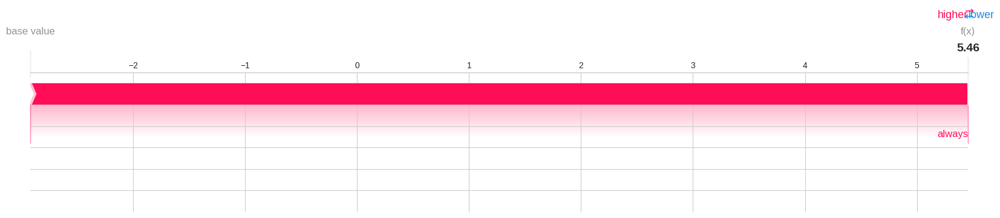

In [123]:
shap.initjs()
shap.force_plot(
    explainer.expected_value[predicted_class],
    shap_values[predicted_class][0],
    tokens,
    feature_names=tokens,
    matplotlib=True
)



In [ ]:
!zip -r output.zip /kaggle/working/



  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/state.db (deflated 20%)
  adding: kaggle/working/X_val_lstm.npy (deflated 81%)
  adding: kaggle/working/X_test_bilstm_no_stop.npy (deflated 85%)
  adding: kaggle/working/bilstm_no_stop_label_encoder.pkl (stored 0%)
  adding: kaggle/working/X_train_bilstm_no_stop.npy (deflated 85%)
  adding: kaggle/working/lstm_model.h5 (deflated 7%)
  adding: kaggle/working/mental_health_model.h5 (deflated 7%)
  adding: kaggle/working/.virtual_documents/ (stored 0%)
  adding: kaggle/working/X_test_lstm.npy (deflated 81%)
  adding: kaggle/working/bert_label_encoder.pkl (deflated 19%)
  adding: kaggle/working/bert_test_input_ids.json (deflated 79%)
  adding: kaggle/working/check.csv (deflated 75%)
  adding: kaggle/working/bert_model_v1/ (stored 0%)
  adding: kaggle/working/bert_model_v1/config.json (deflated 55%)
  adding: kaggle/working/bert_model_v1/model.safetensors (deflated 7%)
  adding: kaggle/working/bilstm_no_stop_tokenizer.pkl (defla

In [ ]:
FileLink('output.zip')